In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [161]:
from google.colab import drive
drive.mount('/content/drive')

df=pd.read_csv("/content/drive/MyDrive/Crimes_2001_to_Present.csv")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [162]:
df.columns

Index(['ID', 'Case Number', 'Date', 'Block', 'IUCR', 'Primary Type',
       'Description', 'Location Description', 'Arrest', 'Domestic', 'Beat',
       'District', 'Ward', 'Community Area', 'FBI Code', 'X Coordinate',
       'Y Coordinate', 'Year', 'Updated On', 'Latitude', 'Longitude',
       'Location'],
      dtype='object')

In [163]:
df=df[df.Year > 2012]

In [164]:
df.drop(columns=['Case Number', 'Block', 'IUCR', 'Primary Type',
       'Description', 'Location Description', 'Arrest', 'Domestic', 'Beat',
       'District', 'Ward', 'FBI Code', 'X Coordinate',
       'Y Coordinate', 'Year', 'Updated On', 'Latitude', 'Longitude',
       'Location'], inplace=True)

In [165]:
df_25=df[df["Community Area"]==worst].drop(columns="Community Area")

In [166]:
df_25["Date_dt"]=df_25["Date"].apply(timer)

In [167]:
df_25["day"]=df_25['Date_dt'].dt.to_period('D')

In [168]:
ca25daily_df=df_25.groupby("day").count().rename(columns={"ID" : "crime_count" })[["crime_count"]]

In [169]:
ca25daily_df.info()

<class 'pandas.core.frame.DataFrame'>
PeriodIndex: 4241 entries, 2013-01-01 to 2024-08-11
Freq: D
Data columns (total 1 columns):
 #   Column       Non-Null Count  Dtype
---  ------       --------------  -----
 0   crime_count  4241 non-null   int64
dtypes: int64(1)
memory usage: 66.3 KB


<Axes: xlabel='day'>

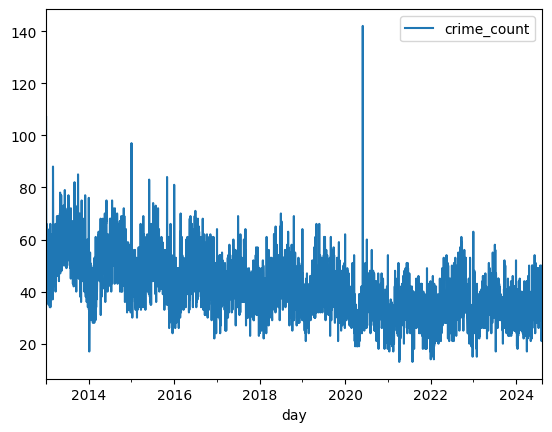

In [170]:
ca25daily_df.plot()

In [171]:
# DATA PREPROCESS

# turn crimes into list
crime_count_list = list(ca25daily_df["crime_count"])

# parameters
sequence_length = 365  # number of days to consider for predicting the next day

# create sequences
X, y = [], []
for i in range(sequence_length, len(crime_count_list)):
    X.append(crime_count_list[i-sequence_length:i])
    y.append(crime_count_list[i])

X = np.array(X)
y = np.array(y)

# train_test_split
train_size = int(len(X) * 0.8)  # 80% for training
X_train_full, X_test, y_train_full, y_test = X[:train_size], X[train_size:], y[:train_size], y[train_size:]

# Further split the training data into training and validation sets
X_train, X_val, y_train, y_val = train_test_split(X_train_full, y_train_full, test_size=0.25, shuffle=False)

In [172]:
scaler=MinMaxScaler()

scaler.fit(X_train)

MinMaxScaler()

In [173]:
X_train_scaled=scaler.transform(X_train)
X_test_scaled=scaler.transform(X_test)
X_val_scaled=scaler.transform(X_val)



In [174]:
# NN Architecture:

model = Sequential()

model.add(layers.Conv1D( filters=64, kernel_size=90, input_shape=(365, 1) ) )
#model.add(Dropout(0.1))

model.add(layers.GRU(units=32, activation='relu'
                     #, return_sequences=True
                    ))
#model.add(Dropout(0.2))

#model.add(layers.Dense(20, activation="relu"))
model.add(layers.Dense(16, activation="relu"))
model.add(layers.Dense(1, activation="linear"))

# 2- Compilation
model.compile(loss='mae',
              optimizer=Adam(learning_rate=0.001))

# 3- Fit
#es = EarlyStopping(patience=0, restore_best_weights=True)

history=model.fit(X_train_scaled, y_train, epochs=10, verbose=0, batch_size= 16 ,validation_data=(X_val_scaled,y_val)
                  #, callbacks=[es]
                 )

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


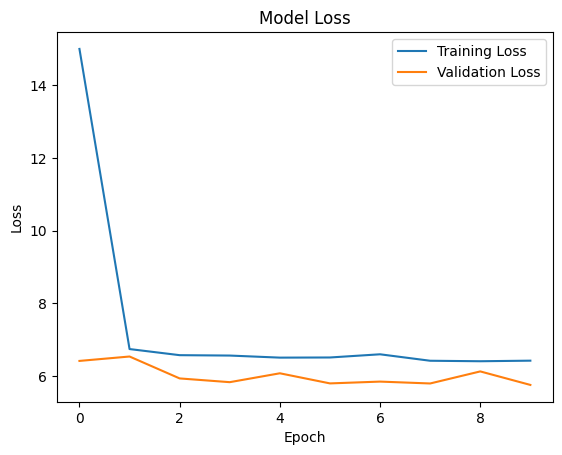

In [175]:
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(loc='upper right')
plt.show()

In [176]:
# 4- Predict
y_pred=model.predict(X_test_scaled)

25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step


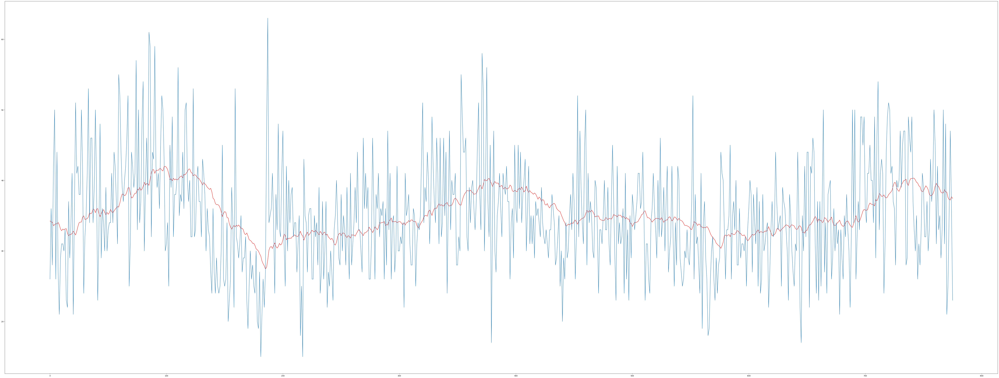

In [177]:
plt.axes([0,0,12,6])
plt.plot(pd.DataFrame(y_pred), color= "red")
plt.plot(pd.DataFrame(y_test))
plt.show()

In [178]:
from sklearn.metrics import mean_absolute_error

mean_absolute_error(y_test, y_pred)

5.847854597052348

In [4]:
# drop the "faulty" years

df=df[df.Year > 2002]

In [5]:
df.drop(columns=['Case Number', 'Block', 'IUCR', 'Primary Type',
       'Description', 'Location Description', 'Arrest', 'Domestic', 'Beat',
       'District', 'Ward', 'FBI Code', 'X Coordinate',
       'Y Coordinate', 'Year', 'Updated On', 'Latitude', 'Longitude',
       'Location'], inplace=True)

**Crimes per community area (ca)**:


In [6]:
ca_df=df.groupby("Community Area").count()[["ID"]].rename(columns={"ID" : "crime_count" })
ca_df

,crime_count
Community Area,
0.0,70
1.0,110718
2.0,92908
3.0,105113
4.0,51475
...,...
73.0,85608
74.0,15979
75.0,57005


<Axes: xlabel='Community Area'>

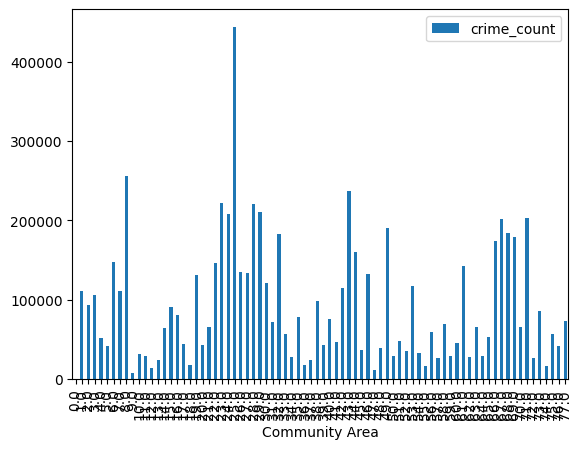

In [8]:
ca_df.plot(kind="bar")

**Daily crimes in ca 25**:

In [44]:
worst =  float(ca_df[ ca_df["crime_count"]==int(ca_df.max()[0]) ].index[0] )
df_25=df[df["Community Area"]==worst].drop(columns="Community Area")

<ipython-input-44-51a5dc798c83>:1: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  worst =  float(ca_df[ ca_df["crime_count"]==int(ca_df.max()[0]) ].index[0] )


In [45]:
# convert date to datetime

from datetime import datetime

def timer(t):
    return datetime.strptime(t, "%m/%d/%Y %I:%M:%S %p")



In [46]:
df_25["Date_dt"]=df_25["Date"].apply(timer)

In [47]:
df_25["day"]=df_25['Date_dt'].dt.to_period('D')

In [48]:
ca25daily_df=df_25.groupby("day").count().rename(columns={"ID" : "crime_count" })[["crime_count"]]

In [49]:
ca25daily_df.info()

<class 'pandas.core.frame.DataFrame'>
PeriodIndex: 7894 entries, 2003-01-01 to 2024-08-11
Freq: D
Data columns (total 1 columns):
 #   Column       Non-Null Count  Dtype
---  ------       --------------  -----
 0   crime_count  7894 non-null   int64
dtypes: int64(1)
memory usage: 123.3 KB


<Axes: xlabel='day'>

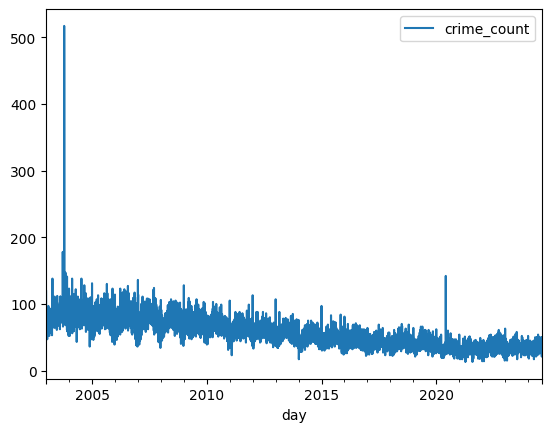

In [50]:
ca25daily_df.plot()

Crime count in 23

In [51]:
df_23=df[df["Community Area"]==23.].drop(columns="Community Area")
df_23["Date_dt"]=df_23["Date"].apply(timer)
df_23["day"]=df_23['Date_dt'].dt.to_period('D')

In [52]:
ca23daily_df=df_23.groupby("day").count().rename(columns={"ID" : "crime_count" })[["crime_count"]]

<Axes: xlabel='day'>

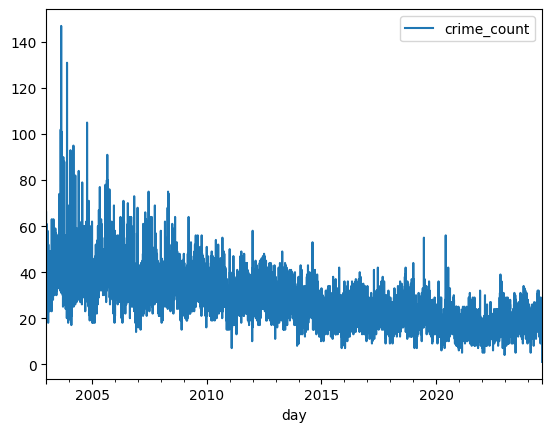

In [53]:
ca23daily_df.plot()

daily in 15:

In [54]:
df_15=df[df["Community Area"]==15.].drop(columns="Community Area")
df_15["Date_dt"]=df_15["Date"].apply(timer)
df_15["day"]=df_15['Date_dt'].dt.to_period('D')

In [55]:
ca15daily_df=df_15.groupby("day").count().rename(columns={"ID" : "crime_count" })[["crime_count"]]

<Axes: xlabel='day'>

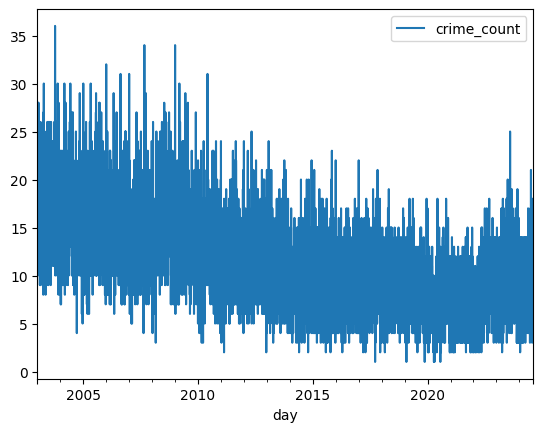

In [56]:
ca15daily_df.plot()

**NN model replace nr in caXXdaily_df to adjust for community area under consideration:**

In [18]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam
from tensorflow.keras import layers
from tensorflow.keras.layers import Dropout

from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.model_selection import train_test_split

In [135]:
# DATA PREPROCESS

# turn crimes into list
crime_count_list = list(ca25daily_df["crime_count"])

# parameters
sequence_length = 365  # number of days to consider for predicting the next day

# create sequences
X, y = [], []
for i in range(sequence_length, len(crime_count_list)):
    X.append(crime_count_list[i-sequence_length:i])
    y.append(crime_count_list[i])

X = np.array(X)
y = np.array(y)

# train_test_split
train_size = int(len(X) * 0.8)  # 80% for training
X_train_full, X_test, y_train_full, y_test = X[:train_size], X[train_size:], y[:train_size], y[train_size:]

# Further split the training data into training and validation sets
X_train, X_val, y_train, y_val = train_test_split(X_train_full, y_train_full, test_size=0.25, shuffle=False)

In [136]:
scaler=MinMaxScaler()

scaler.fit(X_train)

MinMaxScaler()

In [137]:
X_train_scaled=scaler.transform(X_train)
X_test_scaled=scaler.transform(X_test)
X_val_scaled=scaler.transform(X_val)



In [138]:
# NN Architecture:

model = Sequential()

model.add(layers.Conv1D( filters=64, kernel_size=90, input_shape=(365, 1) ) )
#model.add(Dropout(0.1))

model.add(layers.GRU(units=32, activation='relu'
                     #, return_sequences=True
                    ))
#model.add(Dropout(0.2))

#model.add(layers.Dense(20, activation="relu"))
model.add(layers.Dense(16, activation="relu"))
model.add(layers.Dense(1, activation="linear"))

# 2- Compilation
model.compile(loss='mae',
              optimizer=Adam(learning_rate=0.001))

# 3- Fit
#es = EarlyStopping(patience=0, restore_best_weights=True)

history=model.fit(X_train_scaled, y_train, epochs=10, verbose=0, batch_size= 16 ,validation_data=(X_val_scaled,y_val)
                  #, callbacks=[es]
                 )

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


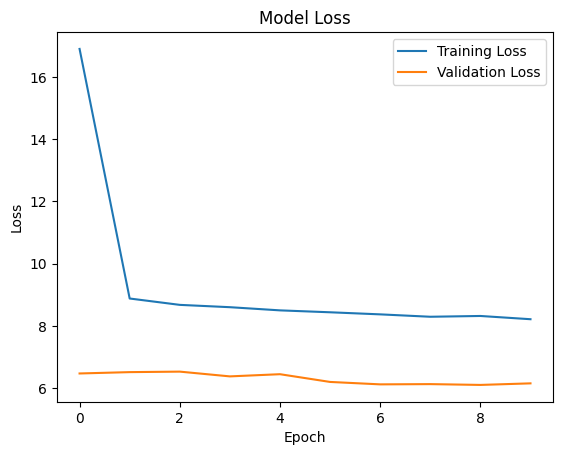

In [139]:
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(loc='upper right')
plt.show()

In [140]:
# 4- Predict
y_pred=model.predict(X_test_scaled)

48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step


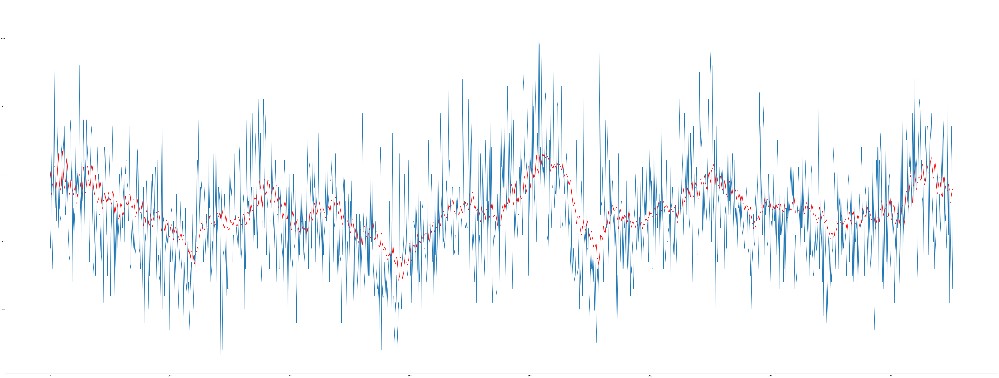

In [141]:
plt.axes([0,0,12,6])
plt.plot(pd.DataFrame(y_pred), color= "red")
plt.plot(pd.DataFrame(y_test))
plt.show()

In [142]:
from sklearn.metrics import mean_absolute_error

mean_absolute_error(y_test, y_pred)

5.638193206483149

In [153]:
X_new= np.array(ca25daily_df[-366:-1])

In [157]:
X_new_scaled=scaler.transform(X_new.transpose())

In [158]:
y_new=model.predict(X_new_scaled)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step


In [160]:
y_new, ca25daily_df.iloc[-1]

(array([[37.653057]], dtype=float32),
 crime_count    23
 Name: 2024-08-11, dtype: int64)

**Now add weather data:**

In [179]:
w25df=pd.read_csv("/content/drive/MyDrive/weather_tps_25.csv")

In [180]:
w25df.columns

Index(['name', 'datetime', 'tempmax', 'tempmin', 'temp', 'feelslikemax',
       'feelslikemin', 'feelslike', 'dew', 'humidity', 'precip', 'precipprob',
       'precipcover', 'preciptype', 'snow', 'snowdepth', 'windgust',
       'windspeed', 'winddir', 'sealevelpressure', 'cloudcover', 'visibility',
       'solarradiation', 'solarenergy', 'uvindex', 'severerisk', 'sunrise',
       'sunset', 'moonphase', 'conditions', 'description', 'icon', 'stations'],
      dtype='object')

In [181]:
weather25_df=w25df.drop(columns=['name', 'tempmax', 'tempmin', 'feelslikemax',
       'feelslikemin', 'feelslike', 'dew', 'humidity', 'precipprob',
       'precipcover', 'preciptype', 'snowdepth', 'windgust',
       'windspeed', 'winddir', 'sealevelpressure', 'cloudcover', 'visibility',
       'solarradiation', 'solarenergy', 'uvindex', 'severerisk', 'sunrise',
       'sunset', 'moonphase', 'conditions', 'description', 'icon', 'stations'])

In [182]:
def to_dt(t):
    return datetime.strptime(t, "%Y-%m-%d")

weather25_df["dt"]=weather25_df["datetime"].apply(to_dt)

In [183]:
weather25_df=weather25_df[ weather25_df["dt"].dt.year > 2002 ]

In [184]:
weather25_df["day"]=weather25_df[ weather25_df["dt"].dt.year > 2002]['dt'].dt.to_period('D')

In [185]:
weather25_df.drop(columns=["datetime","dt"], inplace=True)

In [186]:
weather25_df.sort_values("day", inplace=True)

In [187]:
weather25_df=weather25_df[:-1].set_index("day")

In [188]:
weather25_df

,temp,precip,snow
day,,,
2003-01-01,-0.6,0.000,0.0
2003-01-02,-1.6,0.300,0.0
2003-01-03,-1.9,0.000,0.0
2003-01-04,-2.9,1.126,0.0
2003-01-05,-0.3,1.297,0.0
...,...,...,...
2024-08-07,22.7,0.000,0.0
2024-08-08,23.7,0.000,0.0
2024-08-09,20.1,0.000,0.0


In [189]:
# combine weather and crime into one df:

comb25_df= ca25daily_df.join(weather25_df)
comb25_df

,crime_count,temp,precip,snow
day,,,,
2013-01-01,107,-7.5,0.000,0.0
2013-01-02,53,-7.2,0.000,0.0
2013-01-03,50,-3.2,0.000,0.0
2013-01-04,54,-4.1,0.000,0.0
2013-01-05,66,-0.7,0.572,0.0
...,...,...,...,...
2024-08-07,25,22.7,0.000,0.0
2024-08-08,35,23.7,0.000,0.0
2024-08-09,47,20.1,0.000,0.0


In [190]:
# generate data:

crime_count_list = list(comb25_df["crime_count"])
new_feature_list = list(comb25_df["temp"])


# Parameters
sequence_length = 365  # Number of days to consider for predicting the next day

# Create sequences
X, y = [], []
for i in range(sequence_length, len(crime_count_list)):
    # Create a sequence of [crime_count, new_feature]
    sequence = np.column_stack((crime_count_list[i-sequence_length:i],
                                new_feature_list[i-sequence_length:i]))
    X.append(sequence)
    y.append(crime_count_list[i])  # Target is still the crime count

X = np.array(X)
y = np.array(y)

# Now X has shape (samples, timesteps, features), e.g., (n_samples, 366, 2)

# Train-test split
train_size = int(len(X) * 0.8)  # 80% for training
X_train_full, X_test, y_train_full, y_test = X[:train_size], X[train_size:], y[:train_size], y[train_size:]

# Further split the training data into training and validation sets
X_train, X_val, y_train, y_val = train_test_split(X_train_full, y_train_full, test_size=0.25, shuffle=False)

# X_train, X_val, X_test will all have shape (samples, timesteps, features)

In [191]:
# Scaling:

crime_scaler = MinMaxScaler()
temp_scaler = StandardScaler()

# Reshape to 2D for scaling
X_train_crime = X_train[:, :, 0].reshape(-1, 1)
X_train_temp = X_train[:, :, 1].reshape(-1, 1)

# Fit the scalers on the training data
crime_scaler.fit(X_train_crime)
temp_scaler.fit(X_train_temp)

# Transform the training data
X_train[:, :, 0] = crime_scaler.transform(X_train_crime).reshape(X_train[:, :, 0].shape)
X_train[:, :, 1] = temp_scaler.transform(X_train_temp).reshape(X_train[:, :, 1].shape)

# Transform the validation data
X_val[:, :, 0] = crime_scaler.transform(X_val[:, :, 0].reshape(-1, 1)).reshape(X_val[:, :, 0].shape)
X_val[:, :, 1] = temp_scaler.transform(X_val[:, :, 1].reshape(-1, 1)).reshape(X_val[:, :, 1].shape)

# Transform the test data
X_test[:, :, 0] = crime_scaler.transform(X_test[:, :, 0].reshape(-1, 1)).reshape(X_test[:, :, 0].shape)
X_test[:, :, 1] = temp_scaler.transform(X_test[:, :, 1].reshape(-1, 1)).reshape(X_test[:, :, 1].shape)

# Don't forget to scale the target variable (crime count) as well
#y_train = crime_scaler.transform(y_train.reshape(-1, 1)).flatten()
#y_val = crime_scaler.transform(y_val.reshape(-1, 1)).flatten()
#y_test = crime_scaler.transform(y_test.reshape(-1, 1)).flatten()

# Now X_train, X_val, X_test, y_train, y_val, y_test are all scaled properly

In [192]:
# NN Architecture:

model = Sequential()

model.add(layers.Conv1D( filters=64, kernel_size=90, input_shape=(365, 2) ) )
#model.add(Dropout(0.1))

model.add(layers.GRU(units=16, activation='relu'
                     #, return_sequences=True
                    ))
#model.add(Dropout(0.2))

#model.add(layers.Dense(20, activation="relu"))
model.add(layers.Dense(16, activation="relu"))
model.add(layers.Dense(1, activation="linear"))

# 2- Compilation
model.compile(loss='mae',
              optimizer=Adam(learning_rate=0.001))

# 3- Fit
#es = EarlyStopping(patience=0, restore_best_weights=True)

history=model.fit(X_train, y_train, epochs=10, verbose=0, batch_size= 16 ,validation_data=(X_val,y_val)
                  #, callbacks=[es]
                 )

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


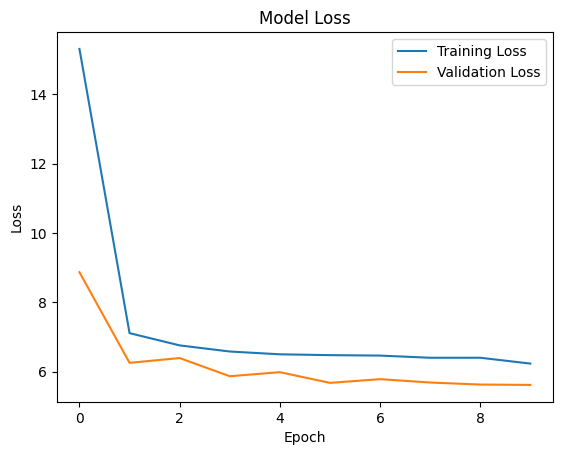

In [193]:
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(loc='upper right')
plt.show()

In [194]:
y_pred=model.predict(X_test)

25/25 ━━━━━━━━━━━━━━━━━━━━ 2s 57ms/step


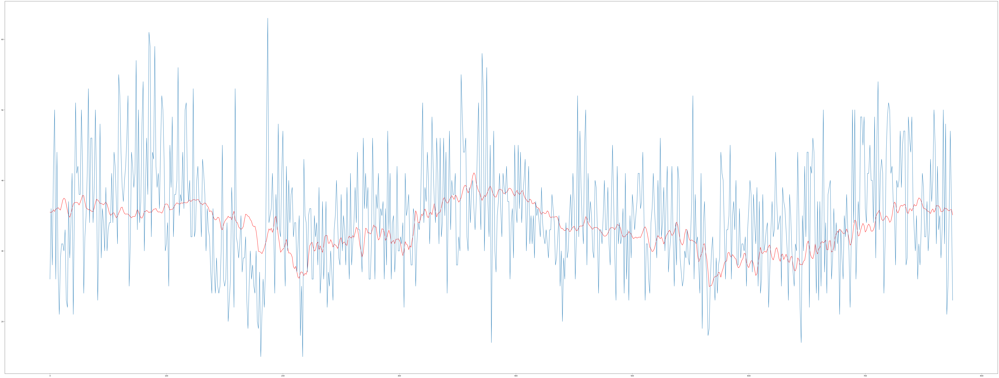

In [195]:
plt.axes([0,0,12,6])
plt.plot(pd.DataFrame(y_pred), color= "red")
plt.plot(pd.DataFrame(y_test))
plt.show()

In [196]:
mean_absolute_error(y_test, y_pred)

5.990861897616043

add precip and snow:


In [197]:
# Feature lists
crime_count_list = list(comb25_df["crime_count"])
temp_list = list(comb25_df["temp"])
precip_list = list(comb25_df["precip"])
snow_list = list(comb25_df["snow"])

sequence_length = 365  # Assuming this is the value you're using for year-ago calculations

# Create sequences
X, y = [], []
for i in range(sequence_length, len(crime_count_list)):
    sequence = np.column_stack((crime_count_list[i-sequence_length:i],
                                temp_list[i-sequence_length:i],
                                precip_list[i-sequence_length:i],
                                snow_list[i-sequence_length:i]
                                ))
    X.append(sequence)
    y.append(crime_count_list[i])  # Target is still the crime count

X = np.array(X)
y = np.array(y)

# Now X has shape (samples, timesteps, features), e.g., (n_samples, 365, 4)

# Train-test split
train_size = int(len(X) * 0.8)  # 80% for training
X_train_full, X_test, y_train_full, y_test = X[:train_size], X[train_size:], y[:train_size], y[train_size:]

# Further split the training data into training and validation sets
X_train, X_val, y_train, y_val = train_test_split(X_train_full, y_train_full, test_size=0.25, shuffle=False)

# X_train, X_val, X_test will all have shape (samples, timesteps, features)

In [198]:
# Initializing scalers
crime_scaler = MinMaxScaler()
temp_scaler = StandardScaler()
precip_scaler = MinMaxScaler()
snow_scaler = MinMaxScaler()

# Reshape features to 2D for individual scaling
X_train_crime = X_train[:, :, 0].reshape(-1, 1)
X_train_temp = X_train[:, :, 1].reshape(-1, 1)
X_train_precip = X_train[:, :, 2].reshape(-1, 1)
X_train_snow = X_train[:, :, 3].reshape(-1, 1)

# Fit the scalers on the training data
crime_scaler.fit(X_train_crime)
temp_scaler.fit(X_train_temp)
precip_scaler.fit(X_train_precip)
snow_scaler.fit(X_train_snow)

# Transform the training data
X_train[:, :, 0] = crime_scaler.transform(X_train_crime).reshape(X_train[:, :, 0].shape)
X_train[:, :, 1] = temp_scaler.transform(X_train_temp).reshape(X_train[:, :, 1].shape)
X_train[:, :, 2] = precip_scaler.transform(X_train_precip).reshape(X_train[:, :, 2].shape)
X_train[:, :, 3] = snow_scaler.transform(X_train_snow).reshape(X_train[:, :, 3].shape)

# Transform the validation data
X_val[:, :, 0] = crime_scaler.transform(X_val[:, :, 0].reshape(-1, 1)).reshape(X_val[:, :, 0].shape)
X_val[:, :, 1] = temp_scaler.transform(X_val[:, :, 1].reshape(-1, 1)).reshape(X_val[:, :, 1].shape)
X_val[:, :, 2] = precip_scaler.transform(X_val[:, :, 2].reshape(-1, 1)).reshape(X_val[:, :, 2].shape)
X_val[:, :, 3] = snow_scaler.transform(X_val[:, :, 3].reshape(-1, 1)).reshape(X_val[:, :, 3].shape)

# Transform the test data
X_test[:, :, 0] = crime_scaler.transform(X_test[:, :, 0].reshape(-1, 1)).reshape(X_test[:, :, 0].shape)
X_test[:, :, 1] = temp_scaler.transform(X_test[:, :, 1].reshape(-1, 1)).reshape(X_test[:, :, 1].shape)
X_test[:, :, 2] = precip_scaler.transform(X_test[:, :, 2].reshape(-1, 1)).reshape(X_test[:, :, 2].shape)
X_test[:, :, 3] = snow_scaler.transform(X_test[:, :, 3].reshape(-1, 1)).reshape(X_test[:, :, 3].shape)


# Scale the target variable (crime count) using the same MinMaxScaler
#y_train = crime_scaler.transform(y_train.reshape(-1, 1)).flatten()
#y_val = crime_scaler.transform(y_val.reshape(-1, 1)).flatten()
#y_test = crime_scaler.transform(y_test.reshape(-1, 1)).flatten()

# Now X_train, X_val, X_test, y_train, y_val, y_test are all scaled properly

In [199]:
# NN Architecture:

model = Sequential()

model.add(layers.Conv1D( filters=64, kernel_size=90, input_shape=(365, 4) ) )
#model.add(Dropout(0.1))

model.add(layers.GRU(units=16, activation='relu'
                     #, return_sequences=True
                    ))
#model.add(Dropout(0.2))

#model.add(layers.Dense(20, activation="relu"))
model.add(layers.Dense(16, activation="relu"))
model.add(layers.Dense(1, activation="linear"))

# 2- Compilation
model.compile(loss='mae',
              optimizer=Adam(learning_rate=0.001))

# 3- Fit
#es = EarlyStopping(patience=0, restore_best_weights=True)

history=model.fit(X_train, y_train, epochs=10, verbose=0, batch_size= 16 ,validation_data=(X_val,y_val)
                  #, callbacks=[es]
                 )

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


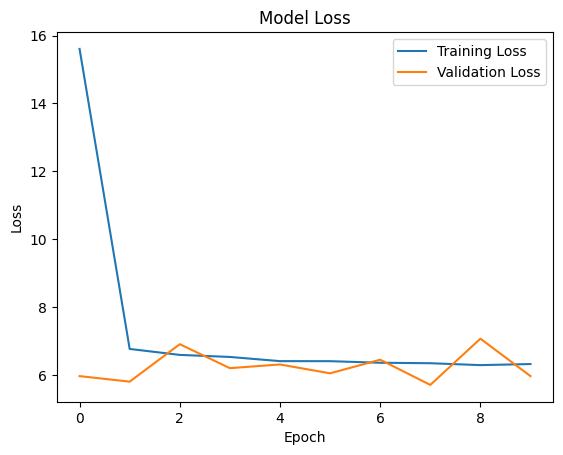

In [200]:
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(loc='upper right')
plt.show()

In [201]:
y_pred=model.predict(X_test)

25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step


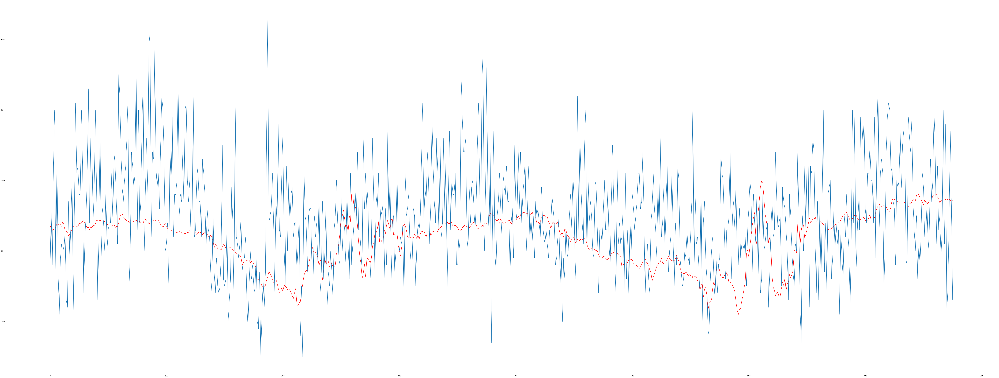

In [202]:
plt.axes([0,0,12,6])
plt.plot(pd.DataFrame(y_pred), color= "red")
plt.plot(pd.DataFrame(y_test))
plt.show()

In [203]:
mean_absolute_error(y_test, y_pred)

6.53403528695254

In [ ]:
mean_absolute_error( crime_scaler.inverse_transform(y_test.reshape(-1, 1)), crime_scaler.inverse_transform(y_pred.reshape(-1, 1)) )

7.651915611835273

In [ ]:
(abs(y_pred)).argmax(), y_pred.argmax()


(1295, 1345)

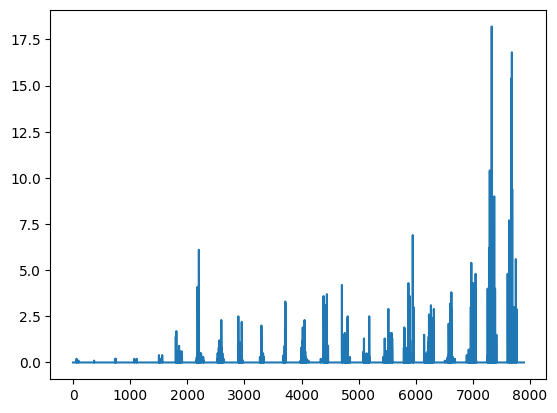

In [ ]:
plt.plot(snow_list)

Incorporate more features:

In [ ]:
def merge_main_holidays():
    #calls the main data frame
    project_id = "wagon-bootcamp-428814"
    query = """
    SELECT
        DATE(`Date`) AS Date_day,
        `Community Area`,
        COUNT(*) AS crime_count
    FROM
        `wagon-bootcamp-428814.chicago_crime.chicago_crime_tab`
    GROUP BY
        Date_day, `Community Area`
    ORDER BY
        Date_day, `Community Area`
    """
    df_main = pd.read_gbq(query, project_id=project_id, dialect='standard')
    #calls the holidays data frame
    query2 = """
    SELECT *
    FROM
        `wagon-bootcamp-428814.chicago_public_hols.chicago_public_hols`
    """
    df_holidays = pd.read_gbq(query2, project_id=project_id, dialect='standard')
    #creates a new column where if there's a holiday then we will have 1
    df_holidays['is_holiday'] = 1
    df_holidays = df_holidays.rename(columns={'Date': 'Date_day'})
    #merged the 2 data frames
    df_merged = df_main.merge(df_holidays[['Date_day', 'is_holiday']], on='Date_day', how='left')
    #fills with 0's the rest of the days the normal days
    df_merged['is_holiday'] = df_merged['is_holiday'].fillna(0).astype(int)
    #set's the Date_day as the index
    df_merged = df_merged.set_index('Date_day')
    df_merged.index=pd.to_datetime(df_merged.index)
    #create's the column day_of_week by name of the day
    df_merged['day_of_week'] = df_merged.index.day_name()
    #assigns the right number to the day of the week
    day_mapping = {
    'Monday': 0,
    'Tuesday': 1,
    'Wednesday': 2,
    'Thursday': 3,
    'Friday': 4,
    'Saturday': 5,
    'Sunday': 6
    }
    df_merged['day_of_week'] = df_merged['day_of_week'].map(day_mapping)
    return df_merged

In [ ]:
df2=merge_main_holidays()


In [ ]:
df25=df2[df2["Community Area"]=="25"].drop(columns=["Community Area"]).sort_values("Date_day")


In [ ]:
df25

,crime_count,is_holiday,day_of_week
Date_day,,,
2001-01-01,17,1,0
2001-01-03,1,0,2
2001-01-07,2,0,6
2001-01-11,1,0,3
2001-01-12,2,0,4
...,...,...,...
2024-08-07,25,0,2
2024-08-08,35,0,3
2024-08-09,47,0,4


In [ ]:
merged_df=df25[df25.index >= "2003-01-01"]

In [ ]:
merged_df

,crime_count,is_holiday,day_of_week
Date_day,,,
2003-01-01,119,1,2
2003-01-02,73,0,3
2003-01-03,91,0,4
2003-01-04,73,0,5
2003-01-05,80,0,6
...,...,...,...
2024-08-07,25,0,2
2024-08-08,35,0,3
2024-08-09,47,0,4


In [ ]:
type(merged_df.index), type(weather25_df.index)

(pandas.core.indexes.datetimes.DatetimeIndex,
 pandas.core.indexes.period.PeriodIndex)

In [ ]:
weather25_df.index = weather25_df.index.to_timestamp()


In [ ]:
total_df = pd.merge(merged_df, weather25_df, left_index=True, right_index=True)

In [ ]:
total_df

,crime_count,is_holiday,day_of_week,temp,precip,snow
2003-01-01,119,1,2,-0.6,0.000,0.0
2003-01-02,73,0,3,-1.6,0.300,0.0
2003-01-03,91,0,4,-1.9,0.000,0.0
2003-01-04,73,0,5,-2.9,1.126,0.0
2003-01-05,80,0,6,-0.3,1.297,0.0
...,...,...,...,...,...,...
2024-08-07,25,0,2,22.7,0.000,0.0
2024-08-08,35,0,3,23.7,0.000,0.0
2024-08-09,47,0,4,20.1,0.000,0.0
2024-08-10,36,0,5,19.5,0.000,0.0


In [ ]:
# Feature lists
crime_count_list = list(total_df["crime_count"])
temp_list = list(total_df["temp"])
precip_list = list(total_df["precip"])
snow_list = list(total_df["snow"])
holiday_list = list(total_df["is_holiday"])

sequence_length = 365  # Assuming this is the value you're using for year-ago calculations

# Create sequences
X, y = [], []
for i in range(sequence_length, len(crime_count_list)):
    sequence = np.column_stack((crime_count_list[i-sequence_length:i],
                                temp_list[i-sequence_length:i],
                                precip_list[i-sequence_length:i],
                                snow_list[i-sequence_length:i],
                                holiday_list[i-sequence_length:i]
                                ))
    X.append(sequence)
    y.append(crime_count_list[i])  # Target is still the crime count

X = np.array(X)
y = np.array(y)

# Now X has shape (samples, timesteps, features), e.g., (n_samples, 365, 4)

# Train-test split
train_size = int(len(X) * 0.8)  # 80% for training
X_train_full, X_test, y_train_full, y_test = X[:train_size], X[train_size:], y[:train_size], y[train_size:]

# Further split the training data into training and validation sets
X_train, X_val, y_train, y_val = train_test_split(X_train_full, y_train_full, test_size=0.25, shuffle=False)

# X_train, X_val, X_test will all have shape (samples, timesteps, features)

In [ ]:
# Initializing scalers
crime_scaler = MinMaxScaler()
temp_scaler = StandardScaler()
precip_scaler = MinMaxScaler()
snow_scaler = MinMaxScaler()

# Reshape features to 2D for individual scaling
X_train_crime = X_train[:, :, 0].reshape(-1, 1)
X_train_temp = X_train[:, :, 1].reshape(-1, 1)
X_train_precip = X_train[:, :, 2].reshape(-1, 1)
X_train_snow = X_train[:, :, 3].reshape(-1, 1)

# Fit the scalers on the training data
crime_scaler.fit(X_train_crime)
temp_scaler.fit(X_train_temp)
precip_scaler.fit(X_train_precip)
snow_scaler.fit(X_train_snow)

# Transform the training data
X_train[:, :, 0] = crime_scaler.transform(X_train_crime).reshape(X_train[:, :, 0].shape)
X_train[:, :, 1] = temp_scaler.transform(X_train_temp).reshape(X_train[:, :, 1].shape)
X_train[:, :, 2] = precip_scaler.transform(X_train_precip).reshape(X_train[:, :, 2].shape)
X_train[:, :, 3] = snow_scaler.transform(X_train_snow).reshape(X_train[:, :, 3].shape)

# Transform the validation data
X_val[:, :, 0] = crime_scaler.transform(X_val[:, :, 0].reshape(-1, 1)).reshape(X_val[:, :, 0].shape)
X_val[:, :, 1] = temp_scaler.transform(X_val[:, :, 1].reshape(-1, 1)).reshape(X_val[:, :, 1].shape)
X_val[:, :, 2] = precip_scaler.transform(X_val[:, :, 2].reshape(-1, 1)).reshape(X_val[:, :, 2].shape)
X_val[:, :, 3] = snow_scaler.transform(X_val[:, :, 3].reshape(-1, 1)).reshape(X_val[:, :, 3].shape)

# Transform the test data
X_test[:, :, 0] = crime_scaler.transform(X_test[:, :, 0].reshape(-1, 1)).reshape(X_test[:, :, 0].shape)
X_test[:, :, 1] = temp_scaler.transform(X_test[:, :, 1].reshape(-1, 1)).reshape(X_test[:, :, 1].shape)
X_test[:, :, 2] = precip_scaler.transform(X_test[:, :, 2].reshape(-1, 1)).reshape(X_test[:, :, 2].shape)
X_test[:, :, 3] = snow_scaler.transform(X_test[:, :, 3].reshape(-1, 1)).reshape(X_test[:, :, 3].shape)


# Scale the target variable (crime count) using the same MinMaxScaler
y_train = crime_scaler.transform(y_train.reshape(-1, 1)).flatten()
y_val = crime_scaler.transform(y_val.reshape(-1, 1)).flatten()
y_test = crime_scaler.transform(y_test.reshape(-1, 1)).flatten()

# Now X_train, X_val, X_test, y_train, y_val, y_test are all scaled properly

In [ ]:
# NN Architecture:

model = Sequential()

model.add(layers.Conv1D( filters=64, kernel_size=128, input_shape=(365, 5) ) )
#model.add(Dropout(0.1))

model.add(layers.GRU(units=16, activation='relu'
                     #, return_sequences=True
                    ))
#model.add(Dropout(0.2))

#model.add(layers.Dense(20, activation="relu"))
model.add(layers.Dense(16, activation="relu"))
model.add(layers.Dense(1, activation="linear"))

# 2- Compilation
model.compile(loss='mae',
              optimizer=Adam(learning_rate=0.001))

# 3- Fit
#es = EarlyStopping(patience=0, restore_best_weights=True)

history=model.fit(X_train, y_train, epochs=20, verbose=1, batch_size= 16 ,validation_data=(X_val,y_val)
                  #, callbacks=[es]
                 )

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/20
283/283 ━━━━━━━━━━━━━━━━━━━━ 52s 152ms/step - loss: 0.0431 - val_loss: 0.0168
Epoch 2/20
283/283 ━━━━━━━━━━━━━━━━━━━━ 41s 145ms/step - loss: 0.0211 - val_loss: 0.0186
Epoch 3/20
283/283 ━━━━━━━━━━━━━━━━━━━━ 82s 146ms/step - loss: 0.0196 - val_loss: 0.0200
Epoch 4/20
283/283 ━━━━━━━━━━━━━━━━━━━━ 83s 152ms/step - loss: 0.0186 - val_loss: 0.0170
Epoch 5/20
283/283 ━━━━━━━━━━━━━━━━━━━━ 82s 154ms/step - loss: 0.0180 - val_loss: 0.0174
Epoch 6/20
283/283 ━━━━━━━━━━━━━━━━━━━━ 81s 151ms/step - loss: 0.0181 - val_loss: 0.0142
Epoch 7/20
283/283 ━━━━━━━━━━━━━━━━━━━━ 40s 143ms/step - loss: 0.0181 - val_loss: 0.0176
Epoch 8/20
283/283 ━━━━━━━━━━━━━━━━━━━━ 43s 150ms/step - loss: 0.0182 - val_loss: 0.0179
Epoch 9/20
283/283 ━━━━━━━━━━━━━━━━━━━━ 43s 151ms/step - loss: 0.0184 - val_loss: 0.0175
Epoch 10/20
283/283 ━━━━━━━━━━━━━━━━━━━━ 41s 145ms/step - loss: 0.0176 - val_loss: 0.0139
Epoch 11/20
283/283 ━━━━━━━━━━━━━━━━━━━━ 82s 146ms/step - loss: 0.0164 - val_loss: 0.0142
Epoch 12/20
283/283

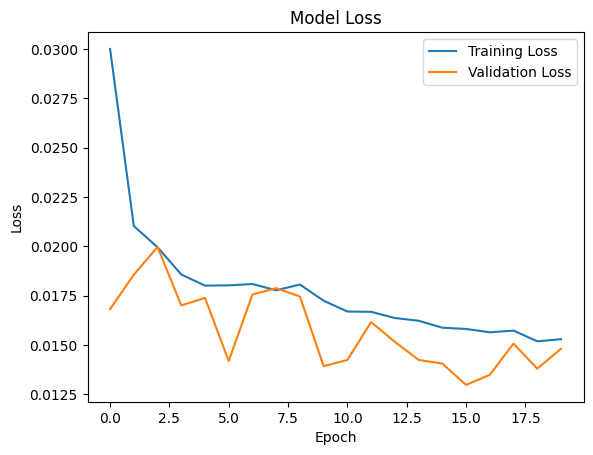

In [ ]:
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(loc='upper right')
plt.show()

In [ ]:
y_pred=model.predict(X_test)

48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step


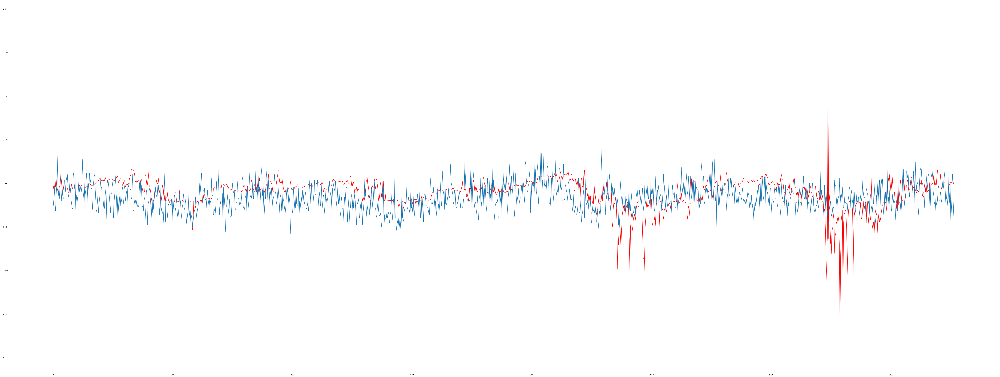

In [ ]:
plt.axes([0,0,12,6])
plt.plot(pd.DataFrame(y_pred), color= "red")
plt.plot(pd.DataFrame(y_test))
plt.show()

In [ ]:
mean_absolute_error(y_test, y_pred)

0.01662307336205149

In [ ]:
mean_absolute_error( crime_scaler.inverse_transform(y_test.reshape(-1, 1)), crime_scaler.inverse_transform(y_pred.reshape(-1, 1)) )

8.311537020254736

try only weather and public holidays:

In [ ]:
# Feature lists
crime_count_list = list(total_df["crime_count"])
holiday_list = list(total_df["is_holiday"])

sequence_length = 365  # Assuming this is the value you're using for year-ago calculations

# Create sequences
X, y = [], []
for i in range(sequence_length, len(crime_count_list)):
    sequence = np.column_stack((crime_count_list[i-sequence_length:i],
                                holiday_list[i-sequence_length:i]
                                ))
    X.append(sequence)
    y.append(crime_count_list[i])  # Target is still the crime count

X = np.array(X)
y = np.array(y)

# Now X has shape (samples, timesteps, features), e.g., (n_samples, 365, 2)

# Train-test split
train_size = int(len(X) * 0.8)  # 80% for training
X_train_full, X_test, y_train_full, y_test = X[:train_size], X[train_size:], y[:train_size], y[train_size:]

# Further split the training data into training and validation sets
X_train, X_val, y_train, y_val = train_test_split(X_train_full, y_train_full, test_size=0.25, shuffle=False)

# X_train, X_val, X_test will all have shape (samples, timesteps, features)

In [ ]:
# Initializing scalers
crime_scaler = MinMaxScaler()

# Reshape features to 2D for individual scaling
X_train_crime = X_train[:, :, 0].reshape(-1, 1)

# Fit the scalers on the training data
crime_scaler.fit(X_train_crime)

# Transform the training data
X_train[:, :, 0] = crime_scaler.transform(X_train_crime).reshape(X_train[:, :, 0].shape)

# Transform the validation data
X_val[:, :, 0] = crime_scaler.transform(X_val[:, :, 0].reshape(-1, 1)).reshape(X_val[:, :, 0].shape)

# Transform the test data
X_test[:, :, 0] = crime_scaler.transform(X_test[:, :, 0].reshape(-1, 1)).reshape(X_test[:, :, 0].shape)

# Scale the target variable (crime count) using the same MinMaxScaler
y_train = crime_scaler.transform(y_train.reshape(-1, 1)).flatten()
y_val = crime_scaler.transform(y_val.reshape(-1, 1)).flatten()
y_test = crime_scaler.transform(y_test.reshape(-1, 1)).flatten()

# Now X_train, X_val, X_test, y_train, y_val, y_test are all scaled properly

In [ ]:
# NN Architecture:

model = Sequential()

model.add(layers.Conv1D( filters=64, kernel_size=55, input_shape=(365, 2) ) )
#model.add(Dropout(0.1))

model.add(layers.GRU(units=16, activation='relu'
                     #, return_sequences=True
                    ))
#model.add(Dropout(0.2))

#model.add(layers.Dense(20, activation="relu"))
model.add(layers.Dense(16, activation="relu"))
model.add(layers.Dense(1, activation="linear"))

# 2- Compilation
model.compile(loss='mae',
              optimizer=Adam(learning_rate=0.001))

# 3- Fit
#es = EarlyStopping(patience=0, restore_best_weights=True)

history=model.fit(X_train, y_train, epochs=20, verbose=1, batch_size= 16 ,validation_data=(X_val,y_val)
                  #, callbacks=[es]
                 )

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/20
142/142 ━━━━━━━━━━━━━━━━━━━━ 18s 84ms/step - loss: 0.0388 - val_loss: 0.0481
Epoch 2/20
142/142 ━━━━━━━━━━━━━━━━━━━━ 13s 94ms/step - loss: 0.0248 - val_loss: 0.0546
Epoch 3/20
142/142 ━━━━━━━━━━━━━━━━━━━━ 19s 84ms/step - loss: 0.0238 - val_loss: 0.0494
Epoch 4/20
142/142 ━━━━━━━━━━━━━━━━━━━━ 21s 90ms/step - loss: 0.0219 - val_loss: 0.0532
Epoch 5/20
142/142 ━━━━━━━━━━━━━━━━━━━━ 13s 90ms/step - loss: 0.0206 - val_loss: 0.0478
Epoch 6/20
142/142 ━━━━━━━━━━━━━━━━━━━━ 20s 89ms/step - loss: 0.0196 - val_loss: 0.0421
Epoch 7/20
142/142 ━━━━━━━━━━━━━━━━━━━━ 20s 86ms/step - loss: 0.0189 - val_loss: 0.0494
Epoch 8/20
142/142 ━━━━━━━━━━━━━━━━━━━━ 21s 90ms/step - loss: 0.0177 - val_loss: 0.0494
Epoch 9/20
142/142 ━━━━━━━━━━━━━━━━━━━━ 13s 90ms/step - loss: 0.0174 - val_loss: 0.0485
Epoch 10/20
142/142 ━━━━━━━━━━━━━━━━━━━━ 21s 90ms/step - loss: 0.0168 - val_loss: 0.0426
Epoch 11/20
142/142 ━━━━━━━━━━━━━━━━━━━━ 19s 82ms/step - loss: 0.0167 - val_loss: 0.0518
Epoch 12/20
142/142 ━━━━━━━━━━

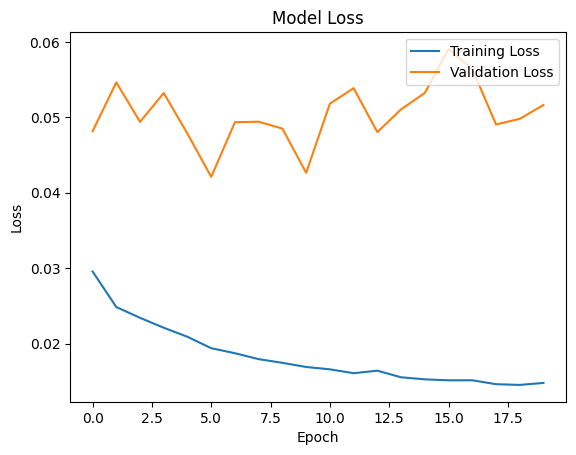

In [ ]:
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(loc='upper right')
plt.show()

In [ ]:
y_pred=model.predict(X_test)

48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step


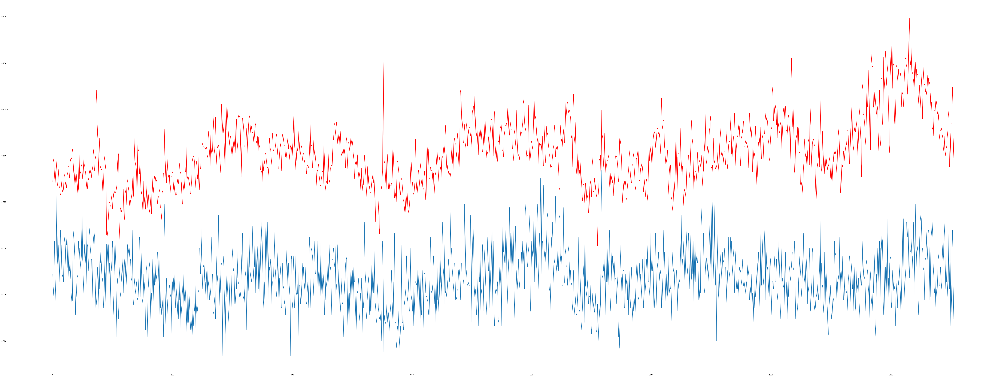

In [ ]:
plt.axes([0,0,12,6])
plt.plot(pd.DataFrame(y_pred), color= "red")
plt.plot(pd.DataFrame(y_test))
plt.show()

In [ ]:
mean_absolute_error(y_test, y_pred)

0.06779673636917415

In [ ]:
mean_absolute_error( crime_scaler.inverse_transform(y_test.reshape(-1, 1)), crime_scaler.inverse_transform(y_pred.reshape(-1, 1)) )

33.89836641896768

RUN MODEL WITH CA 25 23 and 2 outputs (using both to train for one did not help):

In [76]:
# Feature lists

crime_count_23 = list(ca23daily_df["crime_count"])
crime_count_25 = list(ca25daily_df["crime_count"])


sequence_length = 365  # Assuming this is the value you're using for year-ago calculations

# Create sequences
X, y = [], []
for i in range(sequence_length, len(crime_count_list)):
    sequence = np.column_stack((
        #crime_count_15[i-sequence_length:i],
                                crime_count_23[i-sequence_length:i],
                                crime_count_25[i-sequence_length:i]
                                ))
    target_seq=np.column_stack(( crime_count_23[i],
                                 crime_count_25[i]
                                ))
    X.append(sequence)
    y.append(target_seq)

X = np.array(X)
y = np.array(y)

# Now X has shape (samples, timesteps, features), e.g., (n_samples, 365, 4)

# Train-test split
train_size = int(len(X) * 0.8)  # 80% for training
X_train_full, X_test, y_train_full, y_test = X[:train_size], X[train_size:], y[:train_size], y[train_size:]

# Further split the training data into training and validation sets
X_train, X_val, y_train, y_val = train_test_split(X_train_full, y_train_full, test_size=0.25, shuffle=False)

# X_train, X_val, X_test will all have shape (samples, timesteps, features)

In [77]:
# Initializing scalers

scaler23 = MinMaxScaler()
scaler25 = MinMaxScaler()

# Reshape features to 2D for individual scaling

X_train_23 = X_train[:, :, 0].reshape(-1, 1)
X_train_25 = X_train[:, :, 1].reshape(-1, 1)

# Fit the scalers on the training data

scaler23.fit(X_train_23)
scaler25.fit(X_train_25)


# Transform the training data
X_train[:, :, 0] = scaler23.transform(X_train_23).reshape(X_train[:, :, 0].shape)
X_train[:, :, 1] = scaler25.transform(X_train_25).reshape(X_train[:, :, 1].shape)


# Transform the validation data
X_val[:, :, 0] = scaler23.transform(X_val[:, :, 0].reshape(-1, 1)).reshape(X_val[:, :, 0].shape)
X_val[:, :, 1] = scaler25.transform(X_val[:, :, 1].reshape(-1, 1)).reshape(X_val[:, :, 1].shape)

# Transform the test data
X_test[:, :, 0] = scaler23.transform(X_test[:, :, 0].reshape(-1, 1)).reshape(X_test[:, :, 0].shape)
X_test[:, :, 1] = scaler25.transform(X_test[:, :, 1].reshape(-1, 1)).reshape(X_test[:, :, 1].shape)



# Scale the target variable (crime count) using the same MinMaxScaler
#y_train = crime_scaler.transform(y_train.reshape(-1, 1)).flatten()
#y_val = crime_scaler.transform(y_val.reshape(-1, 1)).flatten()
#y_test = crime_scaler.transform(y_test.reshape(-1, 1)).flatten()

# Now X_train, X_val, X_test, y_train, y_val, y_test are all scaled properly

In [85]:
# NN Architecture:

model = Sequential()

model.add(layers.Conv1D( filters=64, kernel_size=128, input_shape=(365, 2) ) )
#model.add(Dropout(0.1))

model.add(layers.GRU(units=16, activation='relu'
                     #, return_sequences=True
                    ))
#model.add(Dropout(0.2))

#model.add(layers.Dense(20, activation="relu"))
model.add(layers.Dense(16, activation="relu"))
model.add(layers.Dense(2, activation="linear"))

# 2- Compilation
model.compile(loss='mae',
              optimizer=Adam(learning_rate=0.001))

# 3- Fit
#es = EarlyStopping(patience=0, restore_best_weights=True)

history=model.fit(X_train, y_train, epochs=10, verbose=1, batch_size= 16 ,validation_data=(X_val,y_val)
                  #, callbacks=[es]
                 )

Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


283/283 ━━━━━━━━━━━━━━━━━━━━ 39s 128ms/step - loss: 37.1344 - val_loss: 14.2198
Epoch 2/10
283/283 ━━━━━━━━━━━━━━━━━━━━ 40s 126ms/step - loss: 10.5213 - val_loss: 15.7803
Epoch 3/10
283/283 ━━━━━━━━━━━━━━━━━━━━ 39s 120ms/step - loss: 10.3823 - val_loss: 17.8216
Epoch 4/10
283/283 ━━━━━━━━━━━━━━━━━━━━ 37s 130ms/step - loss: 10.7341 - val_loss: 15.9988
Epoch 5/10
283/283 ━━━━━━━━━━━━━━━━━━━━ 38s 119ms/step - loss: 10.6113 - val_loss: 16.4315
Epoch 6/10
283/283 ━━━━━━━━━━━━━━━━━━━━ 41s 120ms/step - loss: 10.5912 - val_loss: 16.2480
Epoch 7/10
283/283 ━━━━━━━━━━━━━━━━━━━━ 41s 121ms/step - loss: 10.4941 - val_loss: 16.7333
Epoch 8/10
283/283 ━━━━━━━━━━━━━━━━━━━━ 34s 119ms/step - loss: 10.5604 - val_loss: 18.0580
Epoch 9/10
283/283 ━━━━━━━━━━━━━━━━━━━━ 41s 120ms/step - loss: 10.5699 - val_loss: 16.6132
Epoch 10/10
283/283 ━━━━━━━━━━━━━━━━━━━━ 41s 119ms/step - loss: 10.5972 - val_loss: 15.2880


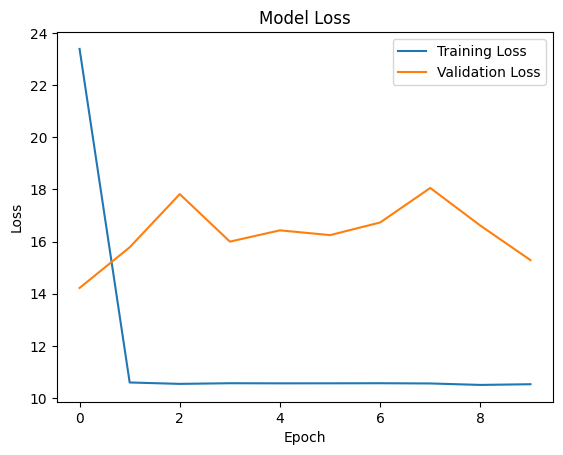

In [86]:
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(loc='upper right')
plt.show()

In [87]:
y_pred=model.predict(X_test)

48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step


In [89]:
y_pred[:,0]

array([29.49509 , 29.49509 , 29.49509 , ..., 29.495087, 29.495087,
       29.495087], dtype=float32)

In [95]:
y_test[:,0][:,0]

array([22, 22, 27, ..., 28, 14, 17])

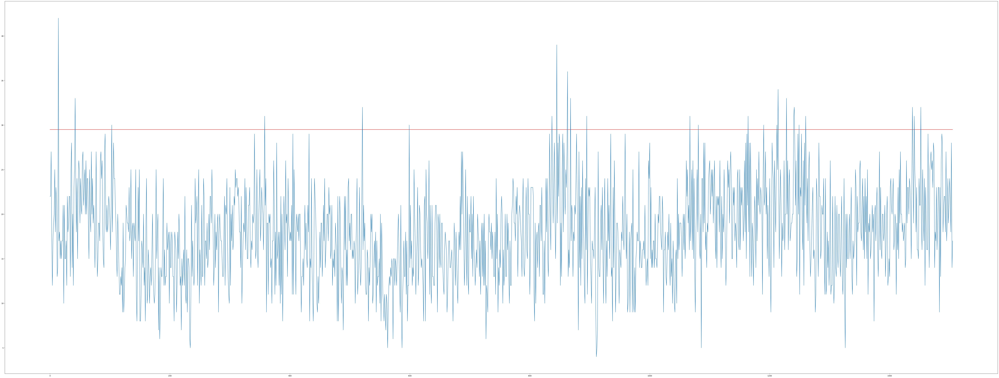

In [96]:
plt.axes([0,0,12,6])
plt.plot(pd.DataFrame(y_pred[:,0]), color= "red")
plt.plot(pd.DataFrame(y_test[:,0][:,0]))
plt.show()

In [75]:
mean_absolute_error(y_test, y_pred)

12.73082400318161

In [67]:
mean_absolute_error( scaler23.inverse_transform(y_test.reshape(-1, 1)), scaler23.inverse_transform(y_pred.reshape(-1, 1)) )

1722.0039282972277